# Upsharp method

Author: Dan Shaked-Renous<br><br>

In this notebook Sarah Shannon and I researched the upsharp method for enhansing the edges constrasts on low-contrast images.<br>
__Conclusion:__ 
- We tested it on HSV and LAB color spaces. The HSV showed potential, while LAB color space didn't show any benefits.
- The method can be used to generate masks and applying them on the other path-searching methods for search region restriction.


In [45]:
import os
from os import listdir
from os.path import isfile, join
import sys
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from skimage import io
from skimage.color import rgb2gray, rgb2hsv, rgb2lab
# Add /scr/data folder to your system path
sys.path.append(os.pardir + '/src/data')

import segment_image as si
from skimage import filters as flt
from skimage.segmentation import watershed
from skimage.filters import sobel
from scipy import ndimage as ndi
from scipy.signal import find_peaks
from scipy.signal import savgol_filter
from skimage import morphology
from skimage.exposure import histogram

In [23]:
from eda_helper import sideBside

In [10]:
fname = '../data/interim/merged_data/not_measured/1M-A31N_10x.jpg' #9L-59_10x.jpg'
image = io.imread(fname)


In [29]:
images = ['1B-A11N_10x.jpg', '1B-A12_10x.jpg',
           '1B-A13_10x.jpg', '1B-B1N_10x.jpg', '1E-A33_10x.jpg',
           '1F-A23_8x.jpg', '1F-B2_10x.jpg', '1M-A11N_10x.jpg',
           '1M-B2_10x.jpg', '1O-A32_8x.jpg']

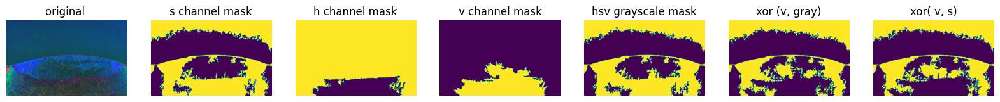

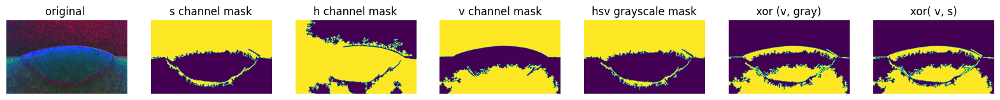

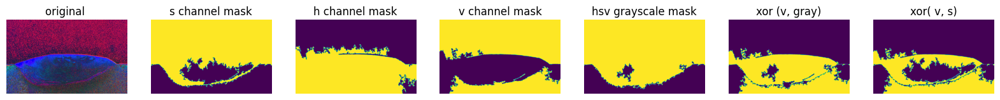

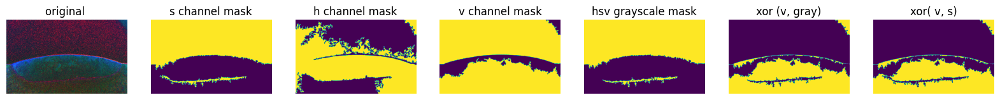

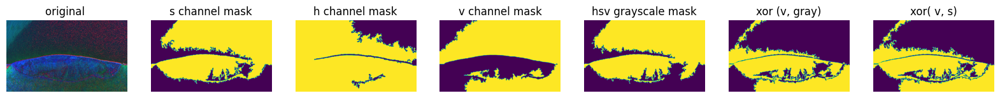

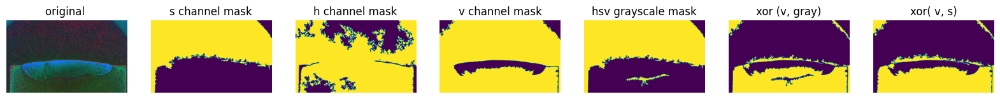

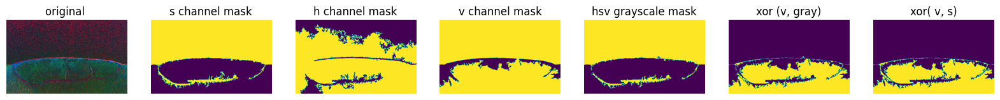

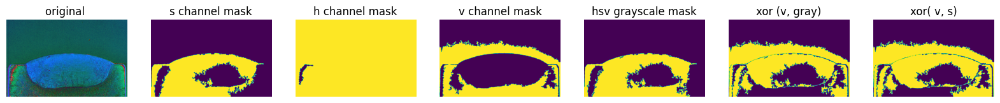

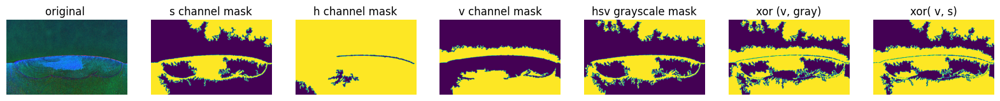

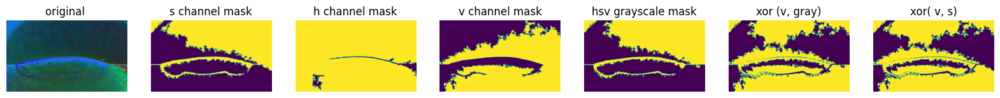

In [40]:
for fname in images:
    image = io.imread('../data/interim/merged_data/not_measured/' + fname)
    image_wo_scale = si.cut_scale_off(image)
    img = rgb2hsv(image_wo_scale)
    amount = 5
    radius = 2
    upsharp_img_h = flt.unsharp_mask(img, radius=radius, 
                                    amount=amount, channel_axis=0)
    gauss_s = flt.gaussian(upsharp_img_h[:,:,1], sigma=5)
    s_mask = gauss_s < flt.threshold_otsu((gauss_s))
    s_mask_no_small_objects = morphology.remove_small_objects(s_mask, 30000)
    s_mask_no_small_objects_holes = morphology.remove_small_holes(s_mask_no_small_objects, 30000)
    
    
    fig, axes = plt.subplots(ncols=7, nrows = 1, figsize=(20, 5))
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title('original ')
    ax[0].set_axis_off()

    
    ax[1].imshow(s_mask_no_small_objects_holes)
    ax[1].set_title('s channel mask')
    ax[1].set_axis_off()

    gauss_h = flt.gaussian(upsharp_img_h[:,:,0], sigma=5)
    h_mask = gauss_h < flt.threshold_otsu((gauss_h))
    h_mask_no_small_objects = morphology.remove_small_objects(h_mask, 30000)
    h_mask_no_small_objects_holes = morphology.remove_small_holes(h_mask_no_small_objects, 30000)

    ax[2].imshow(h_mask_no_small_objects_holes)
    ax[2].set_title('h channel mask')
    ax[2].set_axis_off()

    gauss_v = flt.gaussian(upsharp_img_h[:,:,2], sigma=5)
    v_mask = gauss_v < flt.threshold_otsu((gauss_v))
    v_mask_no_small_objects = morphology.remove_small_objects(v_mask, 30000)
    v_mask_no_small_objects_holes = morphology.remove_small_holes(v_mask_no_small_objects, 30000)
    
    ax[3].imshow(v_mask_no_small_objects_holes)
    ax[3].set_title('v channel mask')
    ax[3].set_axis_off()
    
    gauss_hsvgray = flt.gaussian(rgb2gray(upsharp_img_h), sigma=5)
    gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
    gray_mask_no_small_objects = morphology.remove_small_objects(gray_mask, 30000)
    gray_mask_no_small_objects_holes = morphology.remove_small_holes(gray_mask_no_small_objects, 30000)
    
    ax[4].imshow(gray_mask_no_small_objects_holes)
    ax[4].set_title('hsv grayscale mask')
    ax[4].set_axis_off()
    
    ax[5].imshow(np.abs(np.bitwise_xor(gray_mask_no_small_objects_holes,v_mask_no_small_objects_holes)))
    ax[5].set_title('xor (v, gray)')
    ax[5].set_axis_off()
    
    ax[6].imshow(np.abs(np.bitwise_xor(s_mask_no_small_objects_holes,v_mask_no_small_objects_holes)))
    ax[6].set_title('xor( v, s)')
    ax[6].set_axis_off()


    plt.show()
    


In [110]:
from skimage.color import rgb2hed, rgb2luv

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


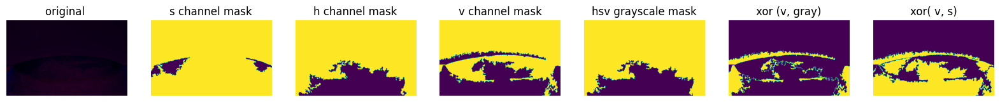

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


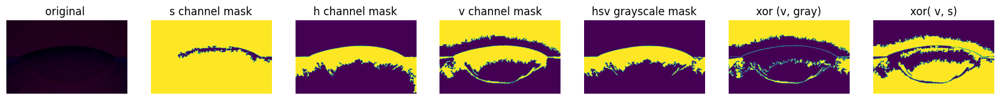

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


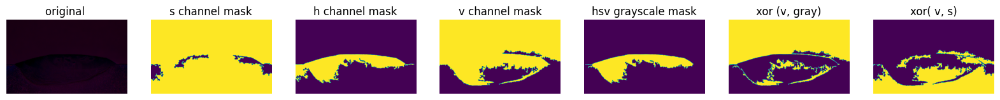

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


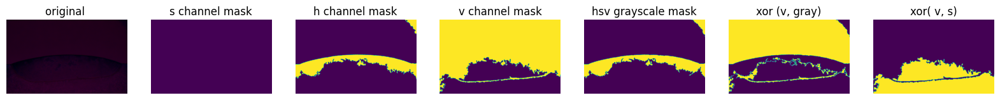

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


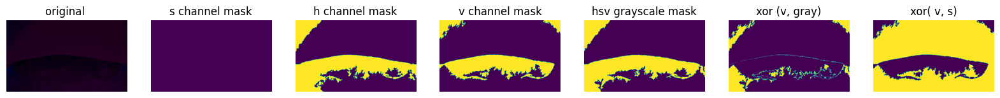

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


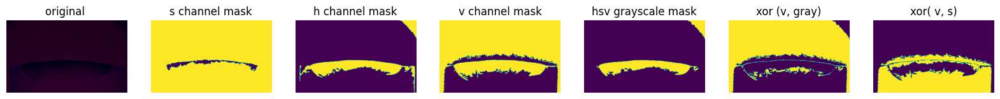

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


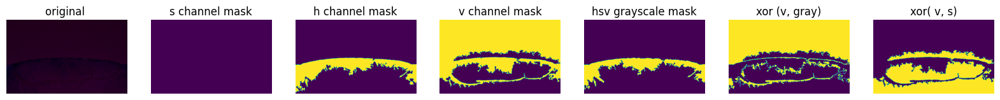

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


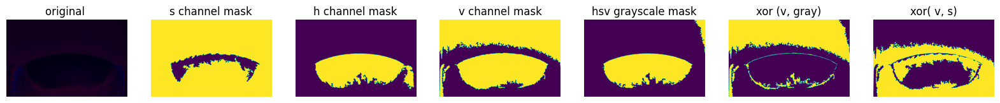

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


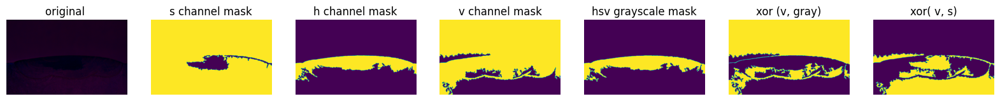

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


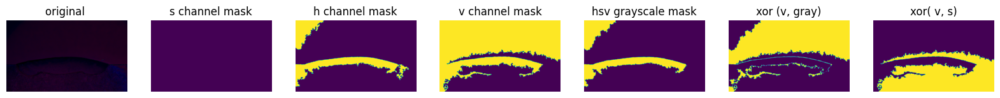

In [121]:
for fname in images:
    image = io.imread('../data/interim/merged_data/not_measured/' + fname)
    image_wo_scale = si.cut_scale_off(image)
    img = rgb2hed(image_wo_scale)
    amount = 5
    radius = 2
    sig = 7
    upsharp_img_h = flt.unsharp_mask(img, radius=radius, 
                                    amount=amount, channel_axis=2)
    gauss_s = flt.gaussian(upsharp_img_h[:,:,1], sigma=sig)
    s_mask = gauss_s < flt.threshold_otsu((gauss_s))
    s_mask_no_small_objects = morphology.remove_small_objects(s_mask, 30000)
    s_mask_no_small_objects_holes = morphology.remove_small_holes(s_mask_no_small_objects, 30000)
    
    
    fig, axes = plt.subplots(ncols=7, nrows = 1, figsize=(20, 5))
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title('original ')
    ax[0].set_axis_off()

    
    ax[1].imshow(s_mask_no_small_objects_holes)
    ax[1].set_title('s channel mask')
    ax[1].set_axis_off()

    gauss_h = flt.gaussian(upsharp_img_h[:,:,0], sigma=sig)
    h_mask = gauss_h < flt.threshold_otsu((gauss_h))
    h_mask_no_small_objects = morphology.remove_small_objects(h_mask, 30000)
    h_mask_no_small_objects_holes = morphology.remove_small_holes(h_mask_no_small_objects, 30000)

    ax[2].imshow(h_mask_no_small_objects_holes)
    ax[2].set_title('h channel mask')
    ax[2].set_axis_off()

    gauss_v = flt.gaussian(upsharp_img_h[:,:,2], sigma=sig)
    v_mask = gauss_v < flt.threshold_otsu((gauss_v))
    v_mask_no_small_objects = morphology.remove_small_objects(v_mask, 30000)
    v_mask_no_small_objects_holes = morphology.remove_small_holes(v_mask_no_small_objects, 30000)
    
    ax[3].imshow(v_mask_no_small_objects_holes)
    ax[3].set_title('v channel mask')
    ax[3].set_axis_off()
    
    gauss_hsvgray = flt.gaussian(rgb2gray(upsharp_img_h), sigma=sig)
    gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
    gray_mask_no_small_objects = morphology.remove_small_objects(gray_mask, 30000)
    gray_mask_no_small_objects_holes = morphology.remove_small_holes(gray_mask_no_small_objects, 30000)
    
    ax[4].imshow(gray_mask_no_small_objects_holes)
    ax[4].set_title('hsv grayscale mask')
    ax[4].set_axis_off()
    
    ax[5].imshow(np.abs(np.bitwise_xor(gray_mask_no_small_objects_holes,v_mask_no_small_objects_holes)))
    ax[5].set_title('xor (v, gray)')
    ax[5].set_axis_off()
    
    ax[6].imshow(np.abs(np.bitwise_xor(s_mask_no_small_objects_holes,v_mask_no_small_objects_holes)))
    ax[6].set_title('xor( v, s)')
    ax[6].set_axis_off()


    plt.show()
    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


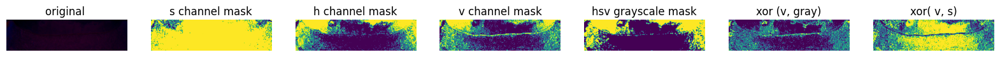

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


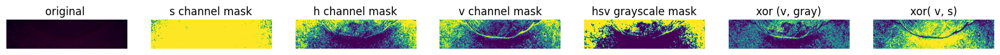

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


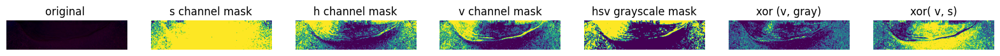

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


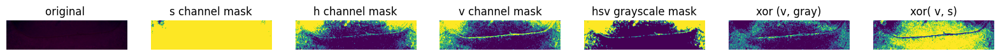

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


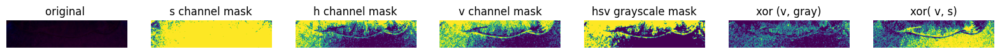

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


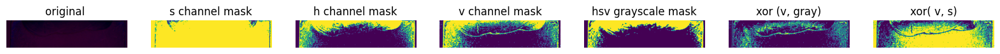

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


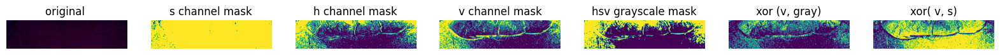

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


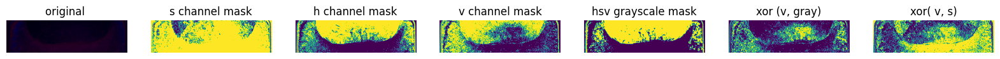

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


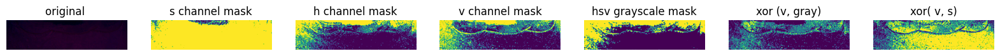

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


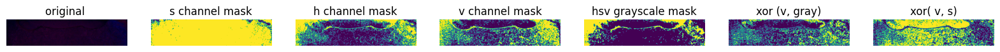

In [130]:
from skimage.exposure import equalize_hist
for fname in images:
    image = io.imread('../data/interim/merged_data/not_measured/' + fname)
    image_wo_scale = si.cut_scale_off(image)[960:]
    img = rgb2hed(image_wo_scale)
    amount = 5
    radius = 2
    sig = 3
    upsharp_img_h = flt.unsharp_mask(img, radius=radius, 
                                    amount=amount, channel_axis=2)
    s_channel = equalize_hist(upsharp_img_h[:,:,1])
    gauss_s = flt.gaussian(s_channel, sigma=sig)
    s_mask = gauss_s < flt.threshold_otsu((gauss_s))
    
    
    
    fig, axes = plt.subplots(ncols=7, nrows = 1, figsize=(20, 5))
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title('original ')
    ax[0].set_axis_off()

    
    ax[1].imshow(s_mask)
    ax[1].set_title('s channel mask')
    ax[1].set_axis_off()

    gauss_h = flt.gaussian(equalize_hist(upsharp_img_h[:,:,0]), sigma=sig)
    h_mask = gauss_h < flt.threshold_otsu((gauss_h))
   
    ax[2].imshow(h_mask)
    ax[2].set_title('h channel mask')
    ax[2].set_axis_off()

    gauss_v = flt.gaussian(equalize_hist(upsharp_img_h[:,:,2]), sigma=sig)
    v_mask = gauss_v < flt.threshold_otsu((gauss_v))
        
    ax[3].imshow(v_mask)
    ax[3].set_title('v channel mask')
    ax[3].set_axis_off()
    
    gauss_hsvgray = flt.gaussian(equalize_hist(rgb2gray(upsharp_img_h)), sigma=5)
    gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
        
    ax[4].imshow(gray_mask)
    ax[4].set_title('hsv grayscale mask')
    ax[4].set_axis_off()
    
    ax[5].imshow(np.abs(np.bitwise_xor(gray_mask,v_mask)))
    ax[5].set_title('xor (v, gray)')
    ax[5].set_axis_off()
    
    ax[6].imshow(np.abs(np.bitwise_xor(s_mask,v_mask)))
    ax[6].set_title('xor( v, s)')
    ax[6].set_axis_off()


    plt.show()
    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


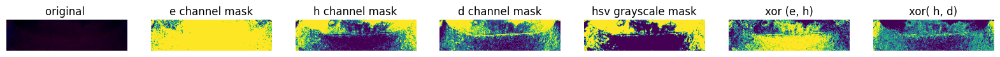

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


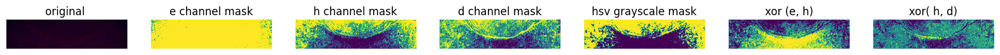

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


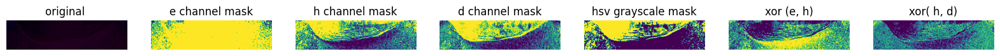

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


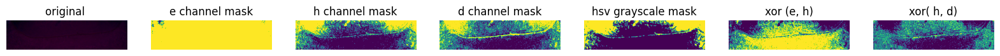

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


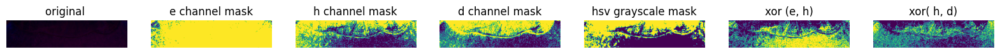

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


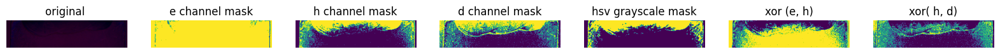

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


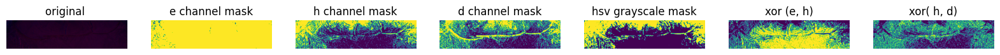

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


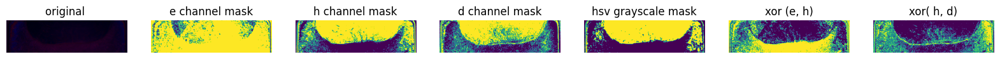

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


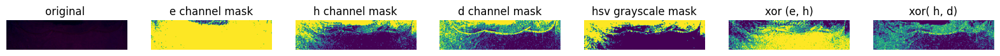

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


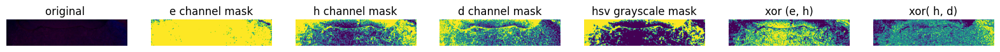

In [127]:
for fname in images:
    image = io.imread('../data/interim/merged_data/not_measured/' + fname)
    image_wo_scale = si.cut_scale_off(image)
    img = rgb2hed(image_wo_scale)[960:]
    amount = 5
    radius = 2
    sig = 3
    upsharp_img_h = flt.unsharp_mask(img, radius=radius, 
                                    amount=amount, channel_axis=2)
    gauss_e = flt.gaussian(upsharp_img_h[:,:,1], sigma=sig)
    e_mask = gauss_e < flt.threshold_otsu((gauss_e))
    
    
    
    fig, axes = plt.subplots(ncols=7, nrows = 1, figsize=(20, 5))
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title('original ')
    ax[0].set_axis_off()

    
    ax[1].imshow(e_mask)
    ax[1].set_title('e channel mask')
    ax[1].set_axis_off()

    gauss_h = flt.gaussian(upsharp_img_h[:,:,0], sigma=sig)
    h_mask = gauss_h < flt.threshold_otsu((gauss_h))
   
    ax[2].imshow(h_mask)
    ax[2].set_title('h channel mask')
    ax[2].set_axis_off()

    gauss_d = flt.gaussian(upsharp_img_h[:,:,2], sigma=sig)
    d_mask = gauss_d < flt.threshold_otsu((gauss_d))
        
    ax[3].imshow(d_mask)
    ax[3].set_title('d channel mask')
    ax[3].set_axis_off()
    
    gauss_hsvgray = flt.gaussian(rgb2gray(upsharp_img_h), sigma=5)
    gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
        
    ax[4].imshow(gray_mask)
    ax[4].set_title('hsv grayscale mask')
    ax[4].set_axis_off()
    
    ax[5].imshow(np.abs(np.bitwise_xor(e_mask,h_mask)))
    ax[5].set_title('xor (e, h)')
    ax[5].set_axis_off()
    
    ax[6].imshow(np.abs(np.bitwise_xor(h_mask,d_mask)))
    ax[6].set_title('xor( h, d)')
    ax[6].set_axis_off()


    plt.show()
    


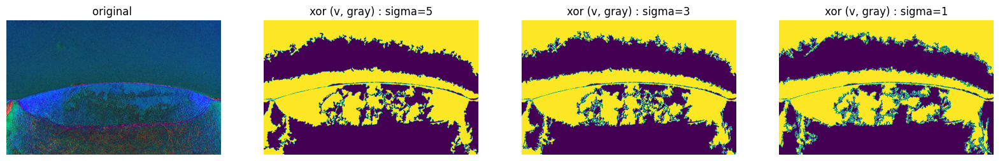

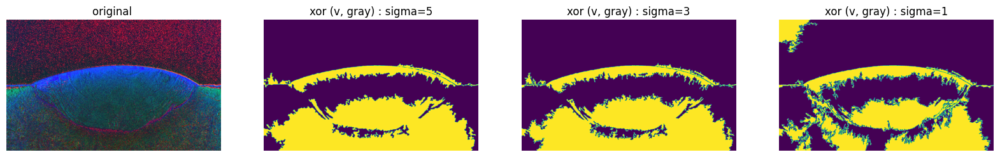

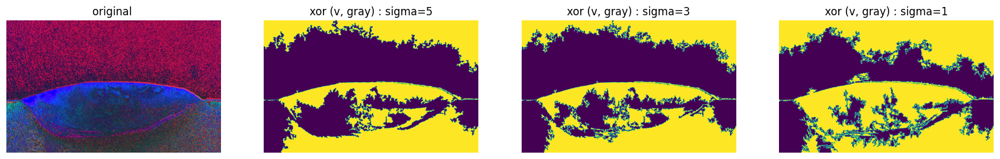

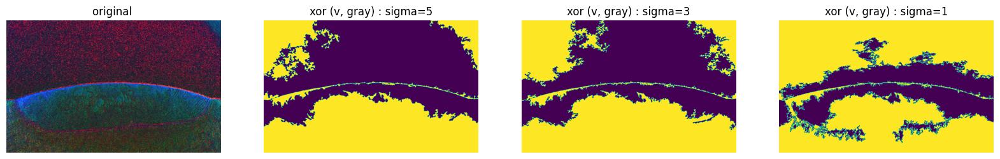

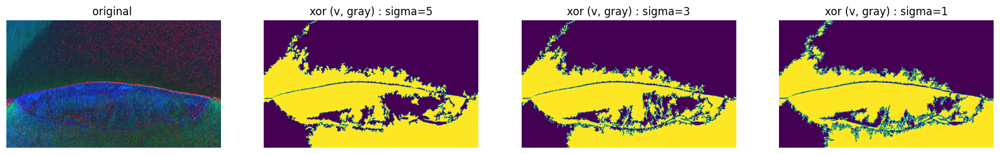

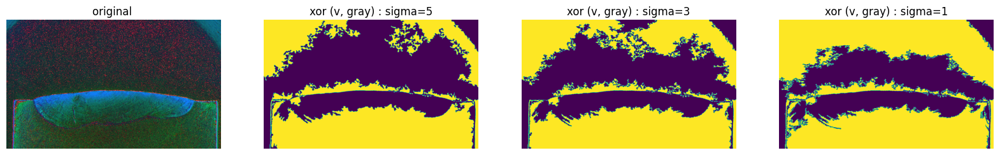

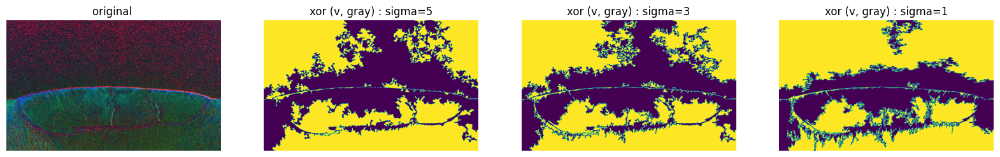

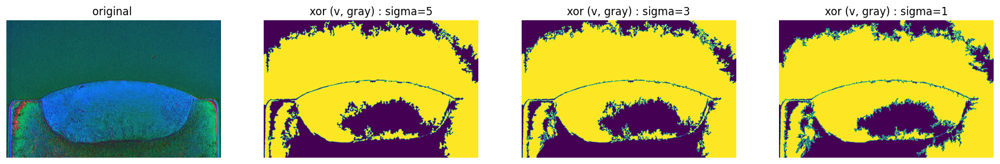

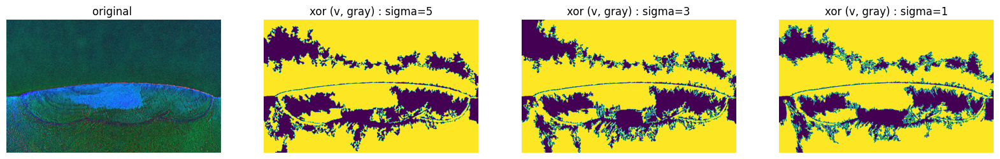

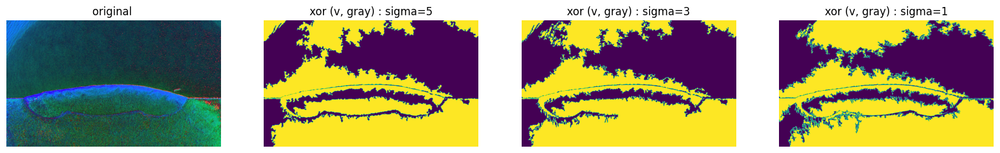

In [131]:
for fname in images:
    image = io.imread('../data/interim/merged_data/not_measured/' + fname)
    image_wo_scale = si.cut_scale_off(image)
    img = rgb2hsv(image_wo_scale)
    amount = 5
    radius = 2
    upsharp_img_h = flt.unsharp_mask(img, radius=radius, 
                                    amount=amount, channel_axis=0)
     
    fig, axes = plt.subplots(ncols=4, nrows = 1, figsize=(20, 5))
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title('original ')
    ax[0].set_axis_off()

    sig = 5
    gauss_v = flt.gaussian(equalize_hist(upsharp_img_h[:,:,2]), sigma=sig)
    v_mask = gauss_v < flt.threshold_otsu((gauss_v))
    v_mask_no_small_objects = morphology.remove_small_objects(v_mask, 30000)
    v_mask_no_small_objects_holes = morphology.remove_small_holes(v_mask_no_small_objects, 30000)
    
    gauss_hsvgray = flt.gaussian(equalize_hist(rgb2gray(upsharp_img_h)), sigma=sig)
    gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
    gray_mask_no_small_objects = morphology.remove_small_objects(gray_mask, 30000)
    gray_mask_no_small_objects_holes = morphology.remove_small_holes(gray_mask_no_small_objects, 30000)
  
    
    ax[1].imshow(np.abs(np.bitwise_xor(gray_mask_no_small_objects_holes,v_mask_no_small_objects_holes)))
    ax[1].set_title('xor (v, gray) : sigma={}'.format(sig))
    ax[1].set_axis_off()
    
    sig = 3
    
    gauss_v = flt.gaussian(equalize_hist(upsharp_img_h[:,:,2]), sigma=sig)
    v_mask = gauss_v < flt.threshold_otsu((gauss_v))
    v_mask_no_small_objects = morphology.remove_small_objects(v_mask, 30000)
    v_mask_no_small_objects_holes = morphology.remove_small_holes(v_mask_no_small_objects, 30000)
    
    gauss_hsvgray = flt.gaussian(equalize_hist(rgb2gray(upsharp_img_h)), sigma=sig)
    gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
    gray_mask_no_small_objects = morphology.remove_small_objects(gray_mask, 30000)
    gray_mask_no_small_objects_holes = morphology.remove_small_holes(gray_mask_no_small_objects, 30000)
  
    
    ax[2].imshow(np.abs(np.bitwise_xor(gray_mask_no_small_objects_holes,v_mask_no_small_objects_holes)))
    ax[2].set_title('xor (v, gray) : sigma={}'.format(sig))
    ax[2].set_axis_off()
    
    sig = 1
    gauss_v = flt.gaussian(equalize_hist(upsharp_img_h[:,:,2]), sigma=sig)
    v_mask = gauss_v < flt.threshold_otsu((gauss_v))
    v_mask_no_small_objects = morphology.remove_small_objects(v_mask, 30000)
    v_mask_no_small_objects_holes = morphology.remove_small_holes(v_mask_no_small_objects, 30000)
    
    gauss_hsvgray = flt.gaussian(equalize_hist(rgb2gray(upsharp_img_h)), sigma=sig)
    gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
    gray_mask_no_small_objects = morphology.remove_small_objects(gray_mask, 30000)
    gray_mask_no_small_objects_holes = morphology.remove_small_holes(gray_mask_no_small_objects, 30000)
  
    
    ax[3].imshow(np.abs(np.bitwise_xor(gray_mask_no_small_objects_holes,v_mask_no_small_objects_holes)))
    ax[3].set_title('xor (v, gray) : sigma={}'.format(sig))
    ax[3].set_axis_off()
    



    plt.show()
    


In [156]:
fname = '1M-A31N_10x.jpg' #images[1]
image = io.imread('../data/interim/merged_data/not_measured/' + fname)
image_wo_scale = si.cut_scale_off(image)
img = rgb2hsv(image_wo_scale)
amount = 5
radius = 2
upsharp_img_h = flt.unsharp_mask(img, radius=radius, 
                                amount=amount, channel_axis=0)
sig = 3
    
gauss_v = flt.gaussian(upsharp_img_h[:,:,2], sigma=sig)
v_mask = gauss_v < flt.threshold_otsu((gauss_v))
v_mask_no_small_objects = morphology.remove_small_objects(v_mask, 30000)
v_mask_no_small_objects_holes = morphology.remove_small_holes(v_mask_no_small_objects, 30000)

gauss_hsvgray = flt.gaussian(rgb2gray(upsharp_img_h), sigma=5)
gray_mask = gauss_hsvgray < flt.threshold_otsu((gauss_hsvgray))
gray_mask_no_small_objects = morphology.remove_small_objects(gray_mask, 30000)
gray_mask_no_small_objects_holes = morphology.remove_small_holes(gray_mask_no_small_objects, 30000)

In [157]:
xor_gray_v = np.bitwise_xor(gray_mask_no_small_objects_holes,v_mask_no_small_objects_holes)

(-0.5, 2583.5, 1642.5, -0.5)

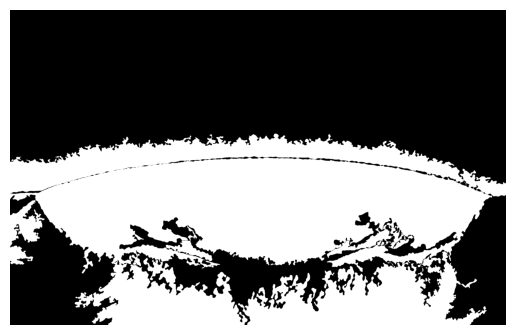

In [178]:
plt.imshow(xor_gray_v, cmap='gray')
plt.axis('off')

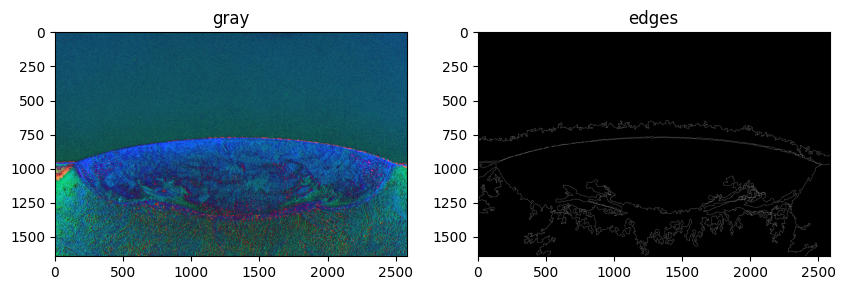

In [158]:
from skimage.feature import canny
edges_image = canny(xor_gray_v)
sideBside(img, edges_image, ttl1='gray', ttl2='edges')

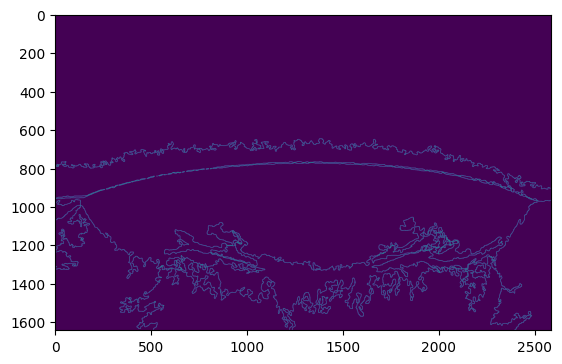

In [159]:
plt.imshow(edges_image)

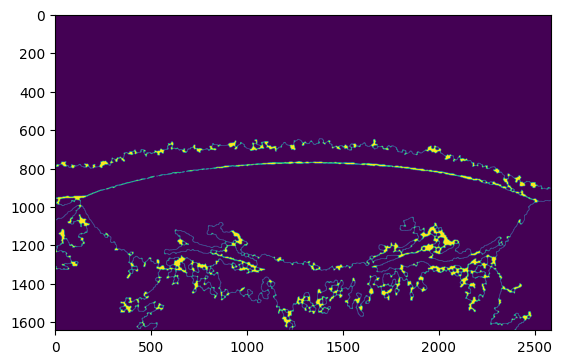

In [160]:
from skimage.measure import find_contours

closed = morphology.closing(edges_image, morphology.disk(6))
plt.imshow(closed)


136 contour(s) found!


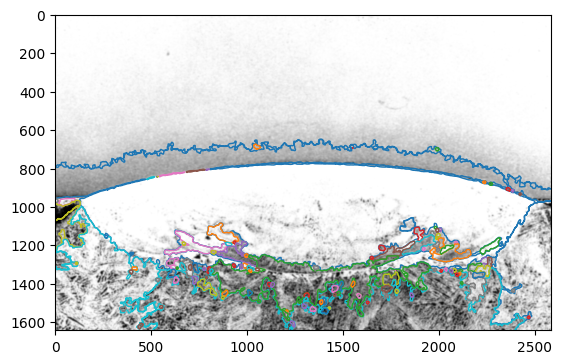

In [161]:

contours = find_contours(closed, fully_connected='high')
print(f'{len(contours)} contour(s) found!')


fig, ax = plt.subplots()
ax.imshow(gauss_v, cmap=plt.cm.gray)

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=1)

136 contour(s) found!


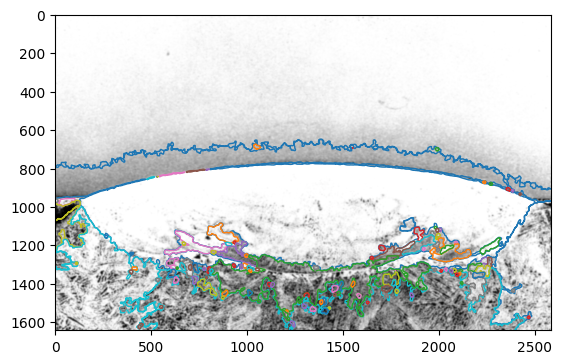

In [ ]:

contours = find_contours(closed, fully_connected='high')
print(f'{len(contours)} contour(s) found!')


fig, ax = plt.subplots()
ax.imshow(gauss_v, cmap=plt.cm.gray)

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=1)

184 contour(s) found!


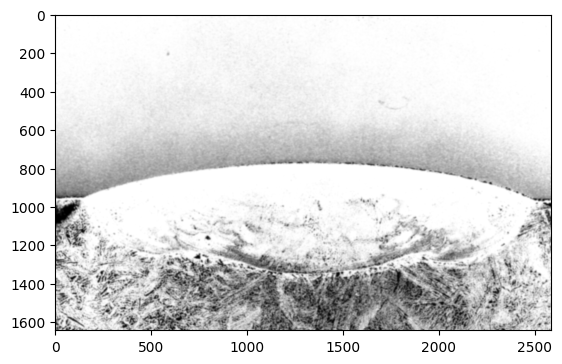

In [162]:

contours = find_contours(edges_image, fully_connected='high')
print(f'{len(contours)} contour(s) found!')


fig, ax = plt.subplots()
ax.imshow(gauss_v, cmap=plt.cm.gray)



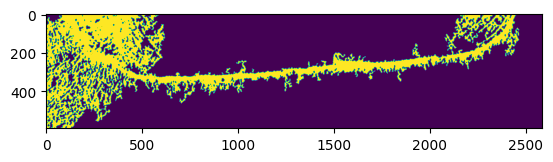

In [163]:
fname = images[3]
image = io.imread('../data/interim/merged_data/not_measured/' + fname)
image_wo_scale = si.cut_scale_off(image)
img = rgb2hed(image_wo_scale)[1000:]
amount = 5
radius = 2
upsharp_img_h = flt.unsharp_mask(img, radius=radius, 
                                amount=amount, channel_axis=0)
sig = 3
    
gauss_d = flt.gaussian(equalize_hist(upsharp_img_h[:,:,2]), sigma=sig)
d_mask = gauss_d < flt.threshold_otsu((gauss_d))
d_mask_no_small_objects = morphology.remove_small_objects(d_mask, 30000)
# d_mask_no_small_objects_holes = morphology.remove_small_holes(d_mask_no_small_objects, 30000)
plt.imshow(d_mask_no_small_objects)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


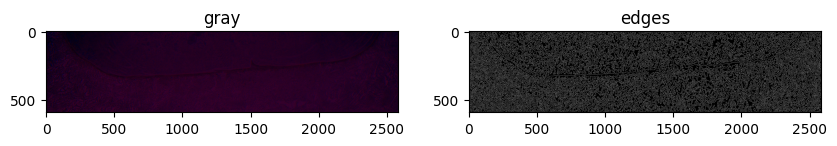

In [164]:
from skimage.feature import canny
edges_image = canny(gauss_d)
sideBside(img, edges_image, ttl1='gray', ttl2='edges')

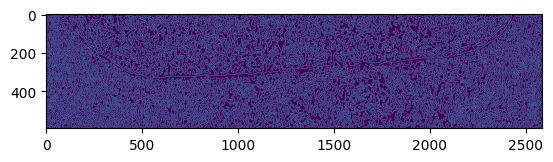

In [165]:
from skimage.measure import find_contours

closed = morphology.closing(edges_image, morphology.disk(5))
plt.imshow(edges_image)


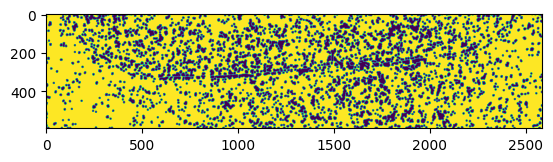

In [166]:
from skimage.segmentation import flood, flood_fill


# Fill a square near the middle with value 127, starting at index (76, 76)
filled_closed = flood_fill(closed, (0, 0), True)

plt.imshow(filled_closed)



1674 contour(s) found!


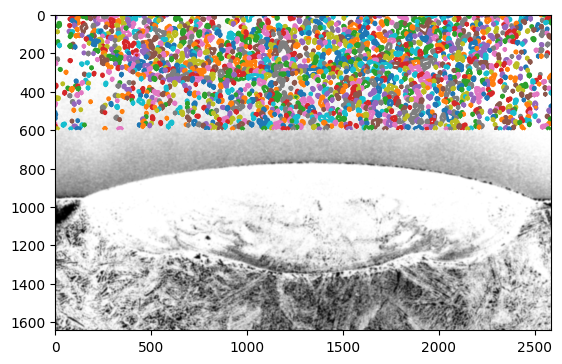

In [167]:

contours = find_contours(closed, fully_connected='high')
print(f'{len(contours)} contour(s) found!')


fig, ax = plt.subplots()
ax.imshow(gauss_v, cmap=plt.cm.gray)

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2)

# Testing the LAB color space
__Conclusion__: This color space is less promising than the HSV

In [168]:
image_wo_scale = si.cut_scale_off(image)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 2583.5, 1592.5, -0.5)

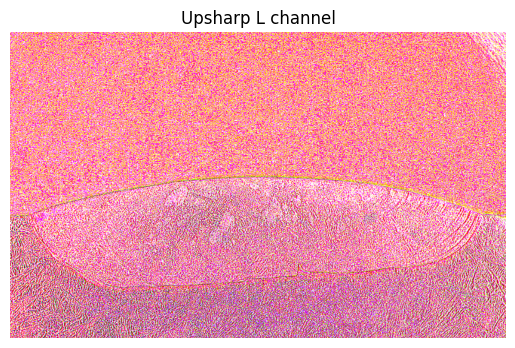

In [169]:
img = rgb2lab(image_wo_scale)
amount = 5
radius = 2
upsharp_img_l = flt.unsharp_mask(img, radius=radius, amount=amount, channel_axis=2)

plt.imshow(upsharp_img_l)
plt.title('Upsharp L channel')
plt.axis('off')

In [170]:
gray = rgb2gray(upsharp_img_l)
binary = gray < flt.threshold_otsu(gray)
# plt.imshow(binary)

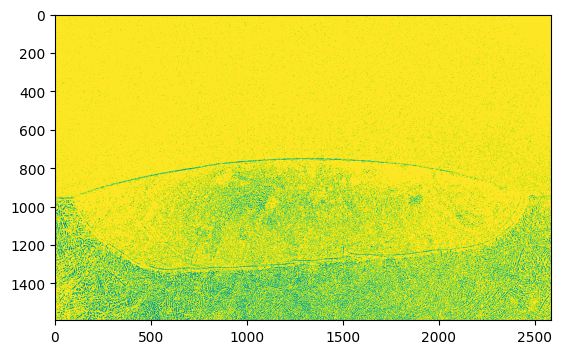

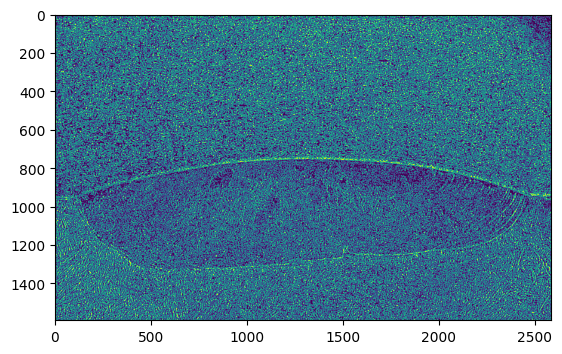

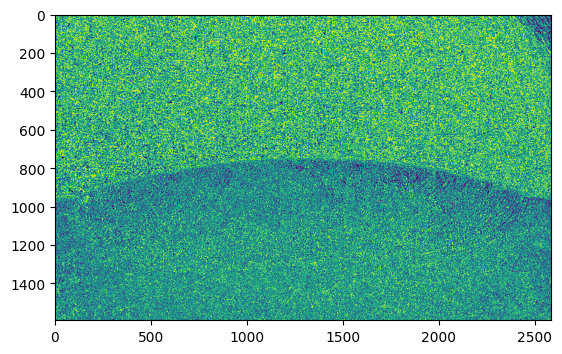

In [171]:
plt.imshow(upsharp_img_l[:,:,0])
plt.show()
binary_l = upsharp_img_l[:,:,0] < flt.threshold_otsu(upsharp_img_l[:,:,0])
binary_a = upsharp_img_l[:,:,1] < flt.threshold_otsu(upsharp_img_l[:,:,1])
binary_b = upsharp_img_l[:,:,2] < flt.threshold_otsu(upsharp_img_l[:,:,2])
plt.imshow(binary_b)
plt.show()
plt.imshow(np.bitwise_xor(np.bitwise_xor(binary_b, binary_a), binary_l))
plt.show()

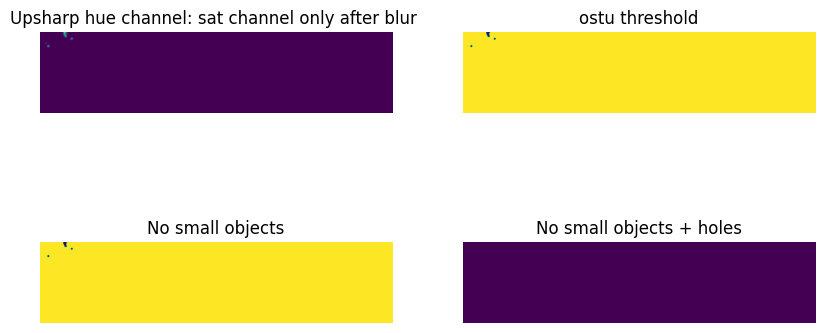

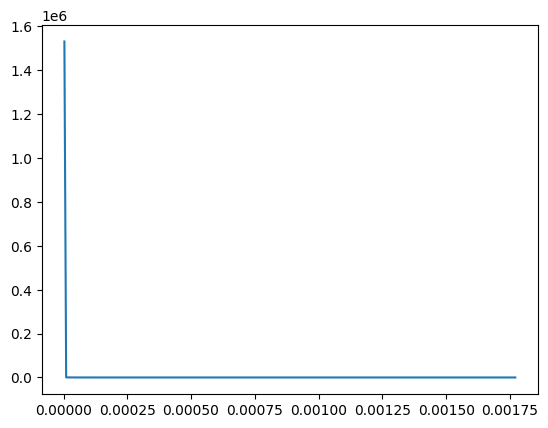

In [172]:
gauss_s = flt.gaussian(upsharp_img_h[:,:,1], sigma=5)
mask = gauss_s < flt.threshold_otsu((gauss_s))
mask_no_small_objects = morphology.remove_small_objects(mask, 30000)
mask_no_small_objects_holes = morphology.remove_small_holes(mask_no_small_objects, 30000)


fig, axes = plt.subplots(ncols=2, nrows = 2, figsize=(10, 5))
ax = axes.ravel()

ax[0].imshow(gauss_s)
ax[0].set_title('Upsharp hue channel: sat channel only after blur ')
ax[0].set_axis_off()

ax[1].imshow(mask)
ax[1].set_title('ostu threshold')
ax[1].set_axis_off()

ax[2].imshow(mask_no_small_objects)
ax[2].set_title('No small objects')
ax[2].set_axis_off()

ax[3].imshow(mask_no_small_objects_holes)
ax[3].set_title('No small objects + holes')
ax[3].set_axis_off()

plt.show()
hist, hist_centers = histogram(gauss_s, nbins=256)
plt.plot(hist_centers, hist)

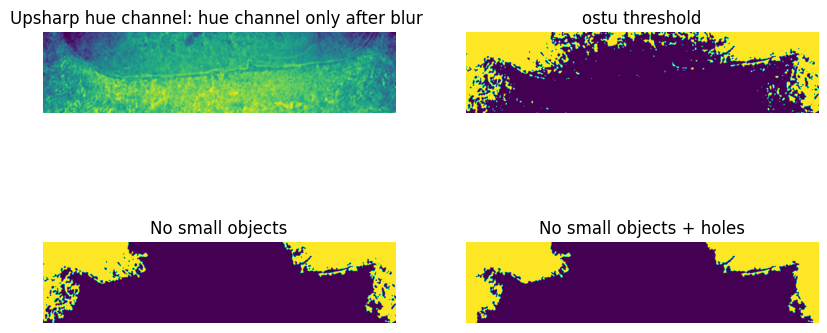

In [173]:
gauss_h = flt.gaussian(upsharp_img_h[:,:,0], sigma=5)
h_mask = gauss_h < flt.threshold_otsu((gauss_h))
h_mask_no_small_objects = morphology.remove_small_objects(h_mask, 30000)
h_mask_no_small_objects_holes = morphology.remove_small_holes(h_mask_no_small_objects, 30000)


fig, axes = plt.subplots(ncols=2, nrows = 2, figsize=(10, 5))
ax = axes.ravel()

ax[0].imshow(gauss_h)
ax[0].set_title('Upsharp hue channel: hue channel only after blur ')
ax[0].set_axis_off()

ax[1].imshow(h_mask)
ax[1].set_title('ostu threshold')
ax[1].set_axis_off()

ax[2].imshow(h_mask_no_small_objects)
ax[2].set_title('No small objects')
ax[2].set_axis_off()

ax[3].imshow(h_mask_no_small_objects_holes)
ax[3].set_title('No small objects + holes')
ax[3].set_axis_off()

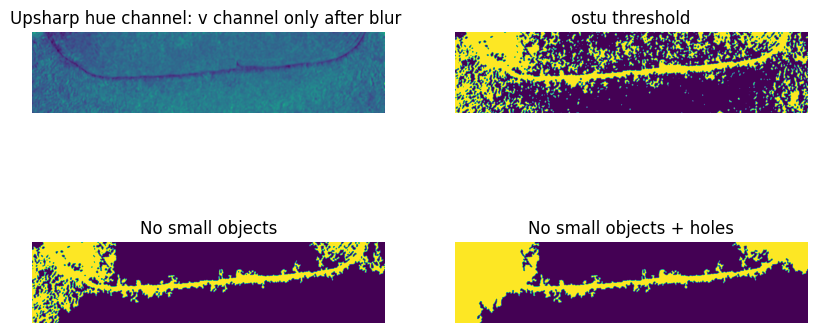

In [174]:
gauss_v = flt.gaussian(upsharp_img_h[:,:,2], sigma=5)
v_mask = gauss_v < flt.threshold_otsu((gauss_v))
v_mask_no_small_objects = morphology.remove_small_objects(v_mask, 30000)
v_mask_no_small_objects_holes = morphology.remove_small_holes(v_mask_no_small_objects, 30000)


fig, axes = plt.subplots(ncols=2, nrows = 2, figsize=(10, 5))
ax = axes.ravel()

ax[0].imshow(gauss_v)
ax[0].set_title('Upsharp hue channel: v channel only after blur ')
ax[0].set_axis_off()

ax[1].imshow(v_mask)
ax[1].set_title('ostu threshold')
ax[1].set_axis_off()

ax[2].imshow(v_mask_no_small_objects)
ax[2].set_title('No small objects')
ax[2].set_axis_off()

ax[3].imshow(v_mask_no_small_objects_holes)
ax[3].set_title('No small objects + holes')
ax[3].set_axis_off()

combining



In [175]:

h_mask = gauss_h < flt.threshold_otsu((gauss_h))
masked_h = np.multiply(h_mask, mask_no_small_objects_holes)
v

fig, axes = plt.subplots(ncols=2, nrows = 3, figsize=(20, 5))
ax = axes.ravel()

ax[0].imshow(h_mask)
ax[0].set_title('ostu threshold ')
ax[0].set_axis_off()

ax[1].imshow(masked_h)
ax[1].set_title('h_masked by s mask')
ax[1].set_axis_off()

ax[2].imshow(closed)
ax[2].set_title('closing 1')
ax[2].set_axis_off()

ax[3].imshow(masked_h + (v_mask_no_small_objects_holes<1))
ax[3].set_title('h + v no small holes and objs')
ax[3].set_axis_off()

ax[4].imshow(np.multiply(masked_h + (v_mask_no_small_objects_holes<1), mask_no_small_objects_holes))
ax[4].set_title('applying again s mask')
ax[4].set_axis_off()

ax[5].imshow(morphology.closing(\
                        np.multiply(masked_h + (v_mask_no_small_objects_holes<1), 
                                    mask_no_small_objects_holes), morphology.disk(7)))
ax[5].set_title('closing 2')
ax[5].set_axis_off()

NameError: name 'v' is not defined